## **1. Introduction**

**COMMENT** change it in latex

Titel: not in south Asia and we don't follow the framingham process, we use the framingham dataset to implement the machine learning algorithms and see the results

framingham dataset was collected in Massachussets, US
the goal is to predict the coronary heart disease in the next 10 years (will the observant have it or not)

Heart Disease (Predicted and Observed Cardiovascular Diseases) in
South Asia : A diagnostic Following the Framingham Process

Also let's remove the section of literature analysis since we do it in the introduction

So, framingham risk score is a separate thing and has nothing to do with our analysis, I would still leave the following part to ecplain how framingham has done it in his work and the problems which might have appeared due to this:

**Framingham Risk Score** 

The Framingham Risk score is one of the first predictive scores for CHD. It is based on the Framingham Heart study examinations of 1971 to 1974, which included participants from either the original Framingham study or from the initial investigation of the Framing- ham Offspring study.

Included subjects (n = 5345) were between 30 to 74 years old and free of CVD. All participants were followed-up for 12 years to ascertain the occurrence of CHD (angina pectoris, recognized and unrecognized MI, coronary insufficiency and CHD death). Hard CHD events included CHD death and MI. 

In 1998, Wilson et al. developed a sex-specific prediction algorithm to estimate 10-year CHD risk by relating the Fifth Report of the Joint National Committee on Detection, Evaluation and Treatment of High Blood Pressure blood pressure and National Cholesterol Education Program cholesterol categories with age, the presence of T2DM and smoking.  

In 2008, D’ Agostino et al., based on a larger cohort of Framingham study, formulated a new sex-specific risk function tool that assessed not only the 10-year probability of CHD events, but also the risk for a first cardiovascular event (CHD, stroke, intermittent claudication and congestive heart failure) . Although many concerns have been raised regarding the applicability and validity of this risk tool in different and diverse populations , many studies have validated it in other populations. Other versions of Framingham risk score have also been developed, including the Lifetime Framingham CVD Risk Score at 50 years of age and the 30-year Framingham cardiovascular risk score .

Even though the Framingham risk score is of the first predictive scores for CHD, it has been outdated by the introduction of the Pooled Cohort Equations, which incorporates the Framingham study cohort. Therefore, the use of the Framingham risk score is not currently recommended.

**COMMENT** change it in latex

In this section we describe the type of data we will be working with and their different Categories, such as the Target Variable, Medical Data (Historal & Current), as well as Demographic and Behavioural Characteristics. We count 3 Demographic variables (Sex, Age, Education) of our sample, 2 Behavioural variables, 4 Medical (historical) indicators, 6 Medical (current) indicators with CHD as a target variable giving us a total of 16 indicators in the data set with a sample of 4238 observations.

## **2. Data description**

Demographic:
1. Sex: male or female, 1 and 0 respectively. (Nominal)
2. Age: age of the patient. (Continuous)
3. Education: four levels of ediucation: 1 - less than high school, 2 - high school graduates, 3 - college graduates, 4 - post-college graduates. (Nominal)

Behavioral:
4. Current Smoker: whether or not the patient is a current smoker, 1 and 0 respectively. (Nominal)
5. Cigs Per Day: the number of cigarettes that the person smoked on average in one day.(Countinious)

Medical(history):
6. BP Meds: whether or not the patient was on blood pressure medication, 1 and 0 respectively. (Nominal)
7. Prevalent Stroke: whether or not the patient had previously had a stroke, 1 and 0 respectively. (Nominal)
8. Prevalent Hyp: whether or not the patient was hypertensive, 1 and 0.  (Nominal)
9. Diabetes: whether or not the patient had diabetes, 1 and 0 respectively. (Nominal)

Medical(current):
10. Tot Chol: total cholesterol level. (Continuous)
11. Sys BP: systolic blood pressure. (Continuous)
12. Dia BP: diastolic blood pressure. (Continuous)
13. BMI: Body Mass Index. (Continuous)
14. Heart Rate: heart rate. (Continuous)
15. Glucose: glucose level. (Continuous)

Target variable:
16. Ten Year CHD: 10 year risk of coronary heart disease CHD, 1 - if yes, 0 - if no. (Nominal)

# **3. Data analysis**

In [111]:
# Install kaggle

#! pip install kaggle

In [112]:
# Import dataset

from google.colab import files
uploaded = files.upload()

Saving framingham.csv to framingham (3).csv


In [113]:
# Import main libraries

import pandas as pd
import io
import numpy as np
from scipy.stats import norm
import matplotlib.pyplot as plt

**COMMENT**

I want the output of the following cell to be inserted to our latex file as it's the overview of how our dataset looks like (the firts 5 lines of it), ofc with the name of the table etc. (smth like Framingham heart disease dataset)

In [114]:
# Read dataset

df = pd.read_csv(io.BytesIO(uploaded['framingham.csv']))
df.head()

,male,age,education,currentSmoker,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose,TenYearCHD
0,1,39,4.0,0,0.0,0.0,0,0,0,195.0,106.0,70.0,26.97,80.0,77.0,0
1,0,46,2.0,0,0.0,0.0,0,0,0,250.0,121.0,81.0,28.73,95.0,76.0,0
2,1,48,1.0,1,20.0,0.0,0,0,0,245.0,127.5,80.0,25.34,75.0,70.0,0
3,0,61,3.0,1,30.0,0.0,0,1,0,225.0,150.0,95.0,28.58,65.0,103.0,1
4,0,46,3.0,1,23.0,0.0,0,0,0,285.0,130.0,84.0,23.10,85.0,85.0,0


In [115]:
# from pandas.plotting import table

# ax = plt.subplot(111, frame_on=False) # no visible frame
# ax.xaxis.set_visible(False)  # hide the x axis
# ax.yaxis.set_visible(False)  # hide the y axis

# table(ax, df.head())  # where df is your data frame

# plt.savefig('mydataset.jpg')

In [116]:
#pip install dataframe_image


**COMMENT**

The majority of observed are females, non-smokers, who didn't have strokes before, with average heart rate and cholesterin levels, who don't have the risk of coronary heart disease happening in the next 10 years

In [117]:
# Description of continuous variables

round(df.iloc[:,[1, 4, 9, 10, 11, 12, 13, 14]].describe(),2)

,age,cigsPerDay,totChol,sysBP,diaBP,BMI,heartRate,glucose
count,4238.00,4209.00,4188.00,4238.00,4238.00,4219.00,4237.00,3850.00
mean,49.58,9.00,236.72,132.35,82.89,25.80,75.88,81.97
std,8.57,11.92,44.59,22.04,11.91,4.08,12.03,23.96
min,32.00,0.00,107.00,83.50,48.00,15.54,44.00,40.00
25%,42.00,0.00,206.00,117.00,75.00,23.07,68.00,71.00
50%,49.00,0.00,234.00,128.00,82.00,25.40,75.00,78.00
75%,56.00,20.00,263.00,144.00,89.88,28.04,83.00,87.00
max,70.00,70.00,696.00,295.00,142.50,56.80,143.00,394.00


**COMMENT**

The main parameters of descriptive statistics for the continuous variables (mean, standard deviation, min and max values, etc.)

## **3.1 Missing Values**

In [118]:
# Normalization of the data, min max normalization

from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
df_cont_normed = pd.DataFrame(scaler.fit_transform(df.iloc[:,[1, 4, 9, 10, 11, 12, 13, 14]]), columns = df.iloc[:,[1, 4, 9, 10, 11, 12, 13, 14]].columns)
df.iloc[:,[1, 4, 9, 10, 11, 12, 13, 14]] = df_cont_normed



In [119]:
#Missing Values 

df.isnull().sum()

male                 0
age                  0
education          105
currentSmoker        0
cigsPerDay          29
BPMeds              53
prevalentStroke      0
prevalentHyp         0
diabetes             0
totChol             50
sysBP                0
diaBP                0
BMI                 19
heartRate            1
glucose            388
TenYearCHD           0
dtype: int64

In [120]:
# Fill NaN (with knn)

from sklearn.impute import KNNImputer

#set the number of neighbors 5
imputer = KNNImputer(n_neighbors=5)

df = pd.DataFrame(imputer.fit_transform(df),columns = df.columns)
df.iloc[:,[0, 2, 3, 5, 6, 7, 8]] = df.iloc[:,[0, 2, 3, 5, 6, 7, 8]].round()
df.head()

,male,age,education,currentSmoker,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose,TenYearCHD
0,1.0,0.184211,4.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.149406,0.106383,0.232804,0.277024,0.363636,0.104520,0.0
1,0.0,0.368421,2.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.242784,0.177305,0.349206,0.319680,0.515152,0.101695,0.0
2,1.0,0.421053,1.0,1.0,0.285714,0.0,0.0,0.0,0.0,0.234295,0.208038,0.338624,0.237518,0.313131,0.084746,0.0
3,0.0,0.763158,3.0,1.0,0.428571,0.0,0.0,1.0,0.0,0.200340,0.314421,0.497354,0.316045,0.212121,0.177966,1.0
4,0.0,0.368421,3.0,1.0,0.328571,0.0,0.0,0.0,0.0,0.302207,0.219858,0.380952,0.183228,0.414141,0.127119,0.0


**COMMENT**

Maybe for mean and for mode we need only the results before fill nan (the cells above) since now the data is normalized and hard to interpret

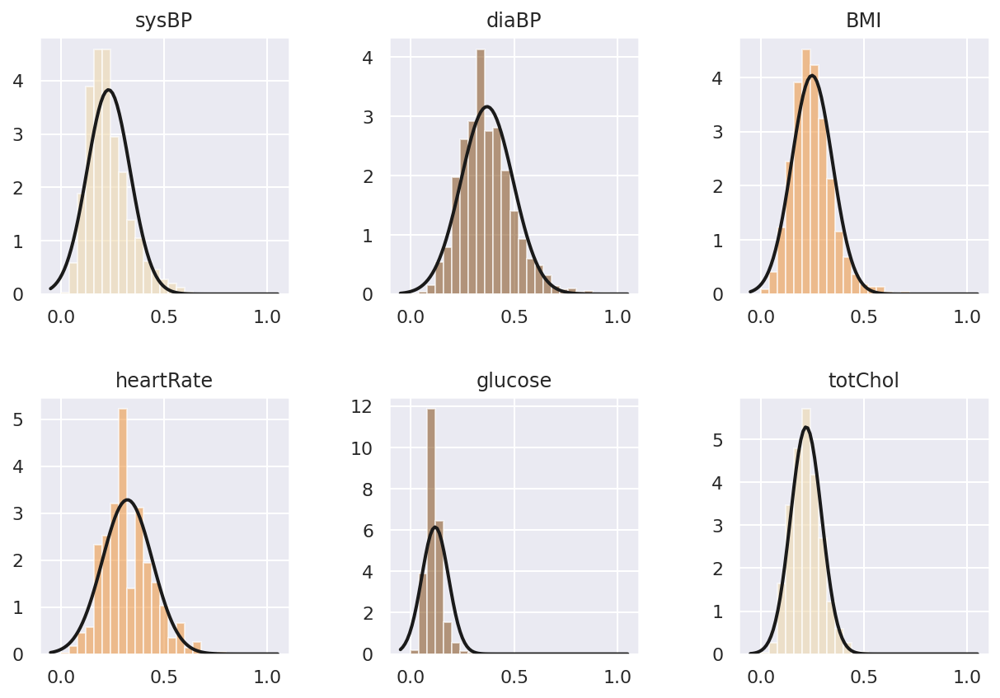

In [121]:
# Histogram plots on current medical data

plt.rcParams["figure.figsize"] = (10,6.5)

plt.subplot(2,3,1)
mu, std = norm.fit(df['sysBP'])
plt.hist(df['sysBP'], bins=25, density=True, alpha=0.6, color='#EED8AE')
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, mu, std)
plt.plot(x, p, 'k',color="k", linewidth=2) 
plt.title('sysBP')

plt.subplot(2,3,2) 
mu, std = norm.fit(df['diaBP'])
plt.hist(df['diaBP'], bins=25, density=True, alpha=0.6, color='#8B5A2B')
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, mu, std)
plt.plot(x, p, 'k',color="k", linewidth=2) 
plt.title('diaBP')

plt.subplot(2,3,3)
mu, std = norm.fit(df['BMI'])
plt.hist(df['BMI'], bins=25, density=True, alpha=0.6, color='#EE9A49')
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, mu, std)
plt.plot(x, p, 'k',color="k", linewidth=2) 
plt.title('BMI')

plt.subplot(2,3,4)
mu, std = norm.fit(df['heartRate'])
plt.hist(df['heartRate'], bins=25, density=True, alpha=0.6, color='#EE9A49')
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, mu, std)
plt.plot(x, p, 'k',color="k", linewidth=2) 
plt.title('heartRate')

plt.subplot(2,3,5)
mu, std = norm.fit(df['glucose'])
plt.hist(df['glucose'], bins=25, density=True, alpha=0.6, color='#8B5A2B')
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, mu, std)
plt.plot(x, p, 'k',color="k", linewidth=2) 
plt.title('glucose')

plt.subplot(2,3,6)
mu, std = norm.fit(df['totChol'])
plt.hist(df['totChol'], bins=25, density=True, alpha=0.6, color='#EED8AE')
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, mu, std)
plt.plot(x, p, 'k',color="k", linewidth=2) 
plt.title('totChol')


plt.subplots_adjust(left=0.1,
                    bottom=0.1,
                    right=0.9,
                    top=0.9,
                    wspace=0.4,
                    hspace=0.4)

plt.show()

**COMMENT**

Above we also need the common name for all the graphs i guess like histogram plots on current medical data

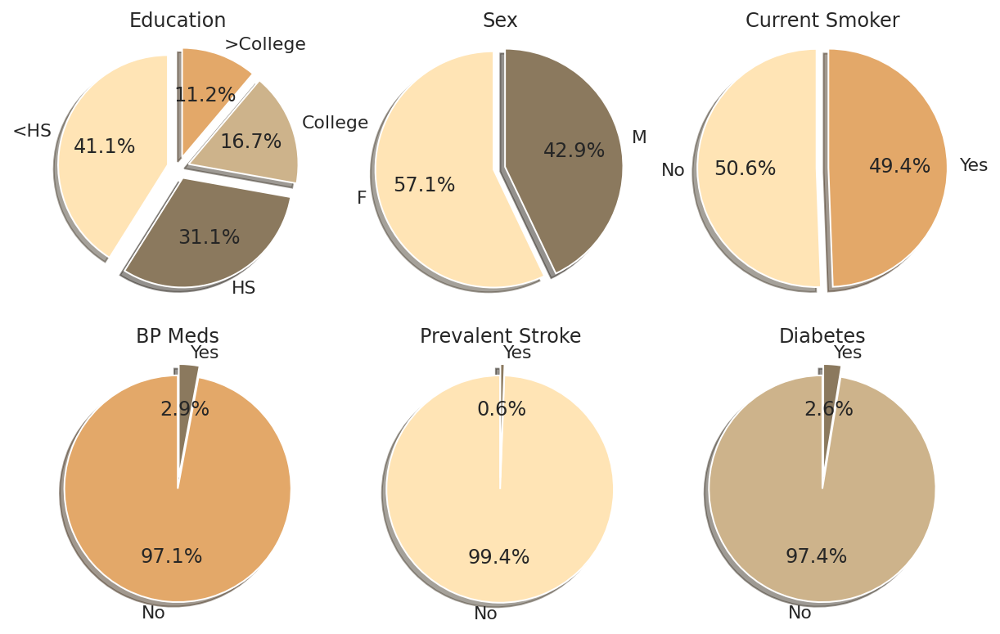

In [122]:
# Pie charts for categorical data

plt.subplot(2,3,1)
labels = ['<HS', 'HS', 
          'College', '>College']
sizes = df['education'].value_counts()
explode = (0.1, 0.1, 0.1, 0.1)
colors = ['#FFE4B5', '#8B795E', '#CDB38B', '#E3A869']


plt.pie(sizes, explode = explode, colors = colors, labels = labels, 
        autopct = '%1.1f%%', shadow = True, startangle = 90)
plt.axis('equal')
plt.title('Education')


plt.subplot(2,3,2)
labels = ['F', 'M']
sizes = df['male'].value_counts()
explode = (0.05, 0.05)
colors = ['#FFE4B5', '#8B795E']

plt.pie(sizes, explode = explode, colors = colors, labels = labels, 
        autopct = '%1.1f%%', shadow = True, startangle = 90)
plt.axis('equal')
plt.title('Sex')


plt.subplot(2,3,3)
labels = ['No', 'Yes']
sizes = df['currentSmoker'].value_counts()
explode = (0.05, 0.05)
colors = ['#FFE4B5', '#E3A869']

plt.pie(sizes, explode = explode, colors = colors, labels = labels, 
        autopct = '%1.1f%%', shadow = True, startangle = 90)
plt.axis('equal')
plt.title('Current Smoker')


plt.subplot(2,3,4)
labels = ['No', 'Yes']
sizes = df['BPMeds'].value_counts()
explode = (0.05, 0.05)
colors = ['#E3A869', '#8B795E']

plt.pie(sizes, explode = explode, colors = colors, labels = labels, 
        autopct = '%1.1f%%', shadow = True, startangle = 90)
plt.axis('equal')
plt.title('BP Meds')


plt.subplot(2,3,5)
labels = ['No', 'Yes']
sizes = df['prevalentStroke'].value_counts()
explode = (0.05, 0.05)
colors = ['#FFE4B5', '#8B795E']

plt.pie(sizes, explode = explode, colors = colors, labels = labels, 
        autopct = '%1.1f%%', shadow = True, startangle = 90)
plt.axis('equal')
plt.title('Prevalent Stroke')


plt.subplot(2,3,6)
labels = ['No', 'Yes']
sizes = df['diabetes'].value_counts()
explode = (0.05, 0.05)
colors = ['#CDB38B', '#8B795E']

plt.pie(sizes, explode = explode, colors = colors, labels = labels, 
        autopct = '%1.1f%%', shadow = True, startangle = 90)
plt.axis('equal')
plt.title('Diabetes')

plt.show()

## **3.2 Feature Selection**

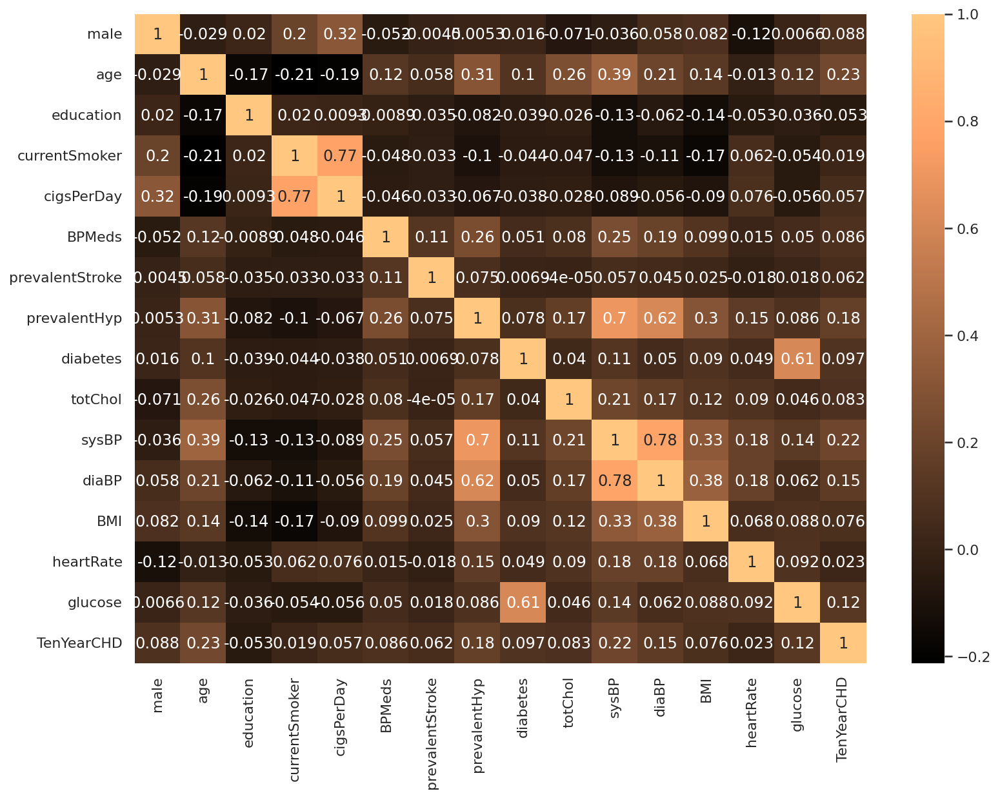

In [178]:
 # Correlation matrix (pearson)

import seaborn as sns
sns.set(rc={'figure.figsize':(12.7,9.27)})
sns.heatmap(df.corr(), cmap="copper", annot=True);

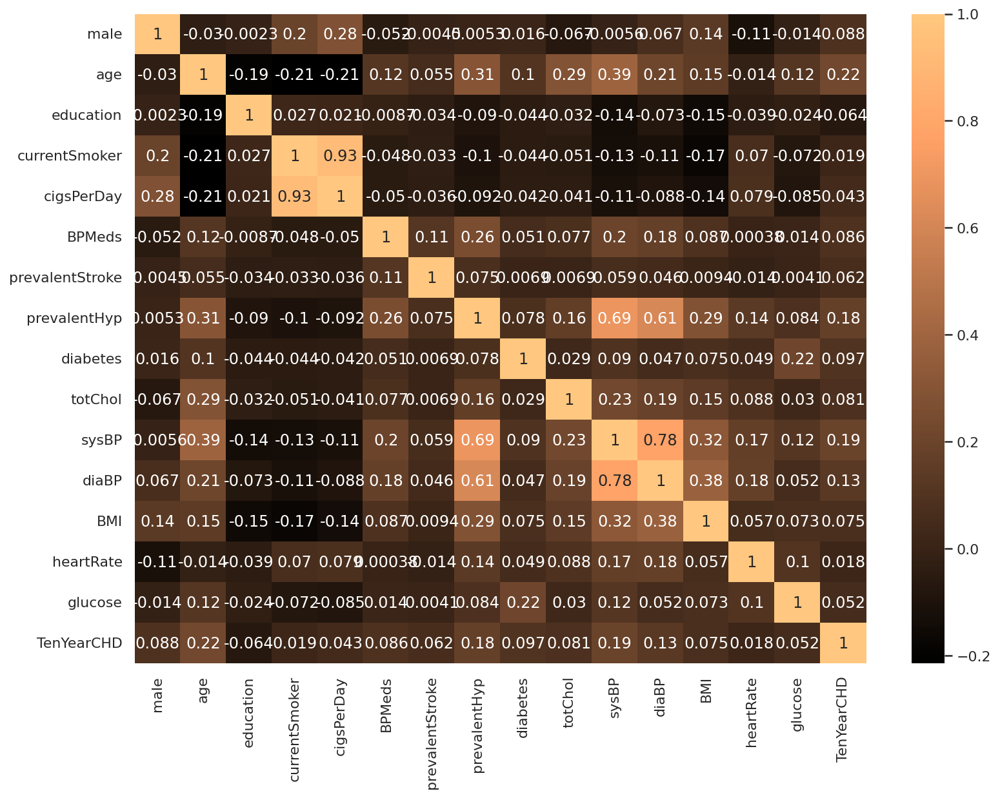

In [180]:
 # Correlation matrix (spearman)

sns.set(rc={'figure.figsize':(12.7,9.27)})
sns.heatmap(df.corr(method='spearman'), cmap="copper", annot=True);


## **3.3 Outlier Detection**

In [181]:
from sklearn.preprocessing import StandardScaler
df_stand = df.copy()
df_stand[['age', 'cigsPerDay', 'totChol', 'sysBP', 'diaBP', 'BMI','heartRate','glucose']] = StandardScaler().fit_transform(df[['age', 'cigsPerDay', 'totChol', 'sysBP', 'diaBP', 'BMI','heartRate','glucose']])



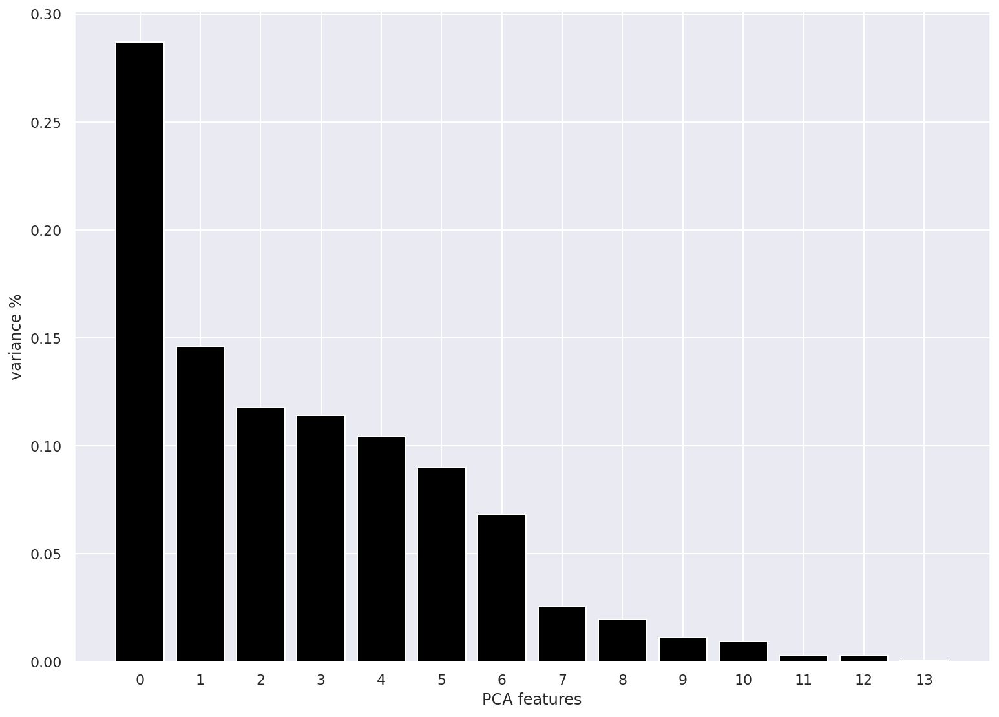

In [182]:
# Imports
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
%config InlineBackend.figure_format='retina'

pca = PCA(n_components=14)
principalComponents = pca.fit_transform(df_stand.iloc[:,:14])
# Plot the explained variances
features = range(pca.n_components_)
plt.bar(features, pca.explained_variance_ratio_, color='black')
plt.xlabel('PCA features')
plt.ylabel('variance %')
plt.xticks(features)
# Save components to a DataFrame
PCA_components = pd.DataFrame(principalComponents)

Text(0, 0.5, 'PCA 2')

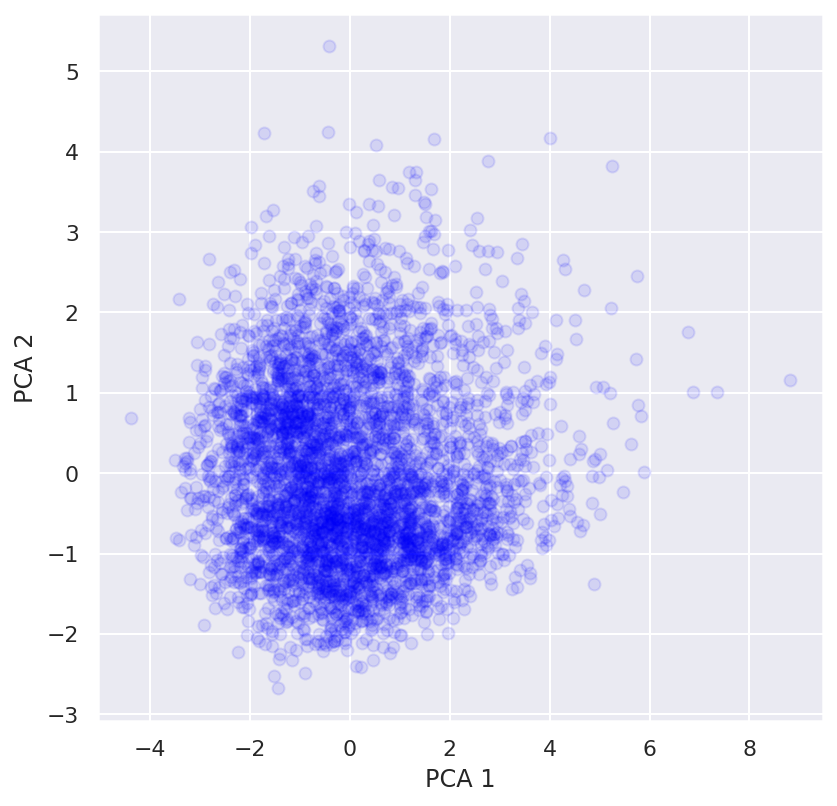

In [183]:
#PCA in two dimesnions

plt.rcParams["figure.figsize"] = (6.5,6.5)
plt.scatter(PCA_components[0], PCA_components[1], alpha=.1, color='blue')
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')

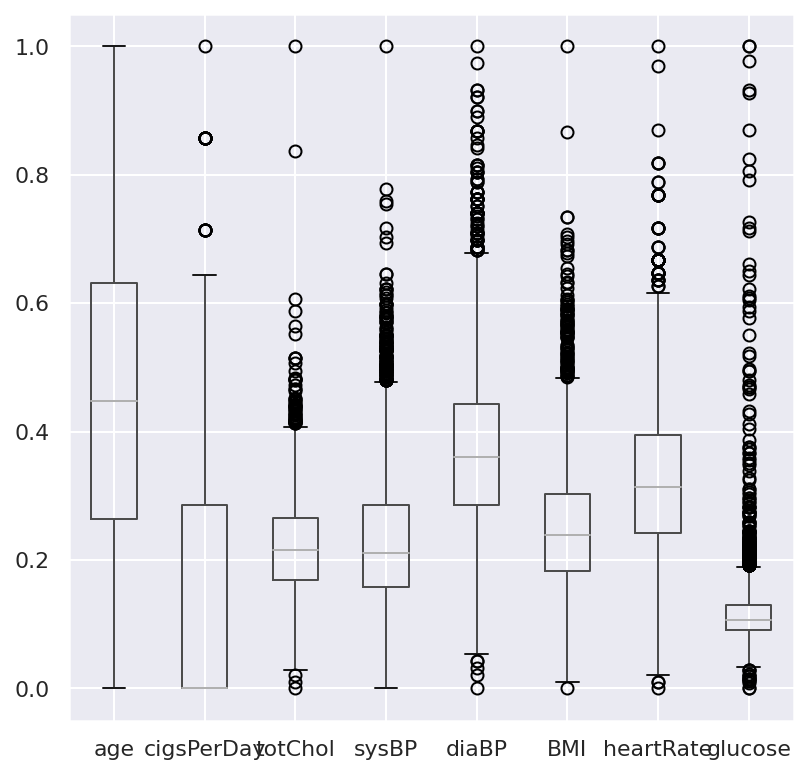

In [184]:
#Box plot of the continuous variables
df.iloc[:,[1, 4, 9, 10, 11, 12, 13, 14]].boxplot()


## **3.4 Further Analysis**

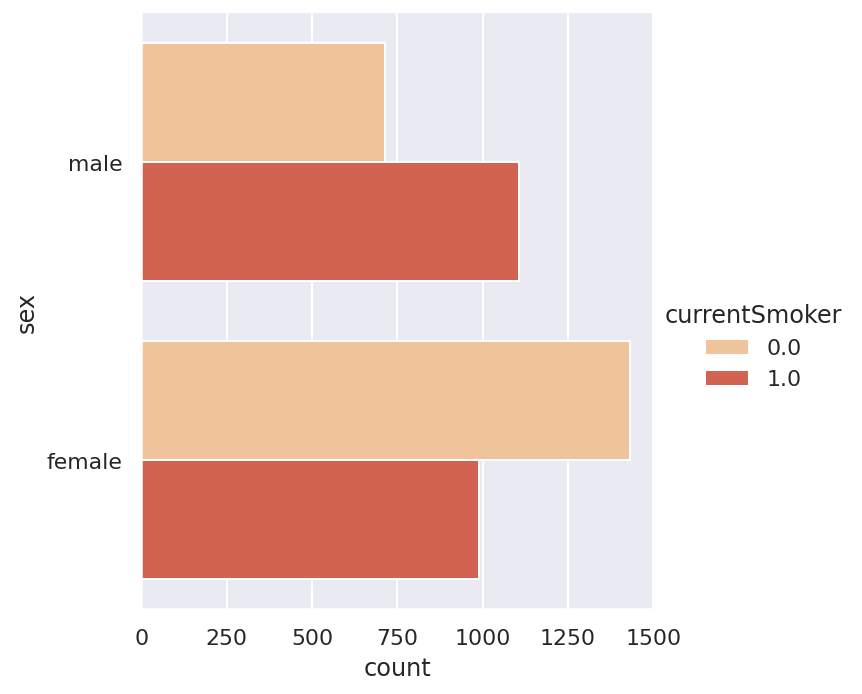

In [185]:
# Current smoker by sex

import seaborn as sns
df['sex'] = df['male'].copy()
df['sex'] = df['sex'].replace([1], 'male')
df['sex'] = df['sex'].replace([0], 'female')
sns.catplot(data=df, y='sex', hue='currentSmoker', kind='count', 
            palette='OrRd')

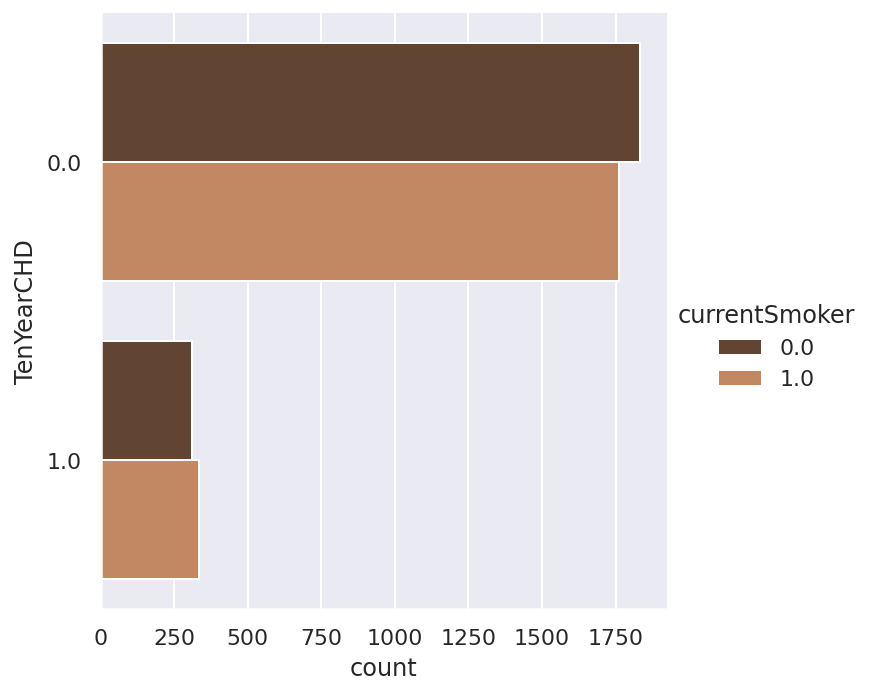

In [186]:
# 10 years heart disease by sex

sns.catplot(data=df, y='TenYearCHD', hue='currentSmoker', kind='count', 
            palette='copper')

In [187]:
# Number of observants having diabetis

pd.crosstab(index=df['diabetes'], columns='count')

col_0,count
diabetes,
0.0,4129
1.0,109


In [188]:
# Number of observants having heart disease

pd.crosstab(index=df['TenYearCHD'], columns='count')

col_0,count
TenYearCHD,
0.0,3594
1.0,644


In [189]:
df['education']  = df['education'] - 1


# **4. Logistic regression**

<strong>Metrics</strong>
<p>Accuracy - measures the correct answers of the algorythm</p>
<p>Precision - the share of objects called "positive" by the algorythm and actually being positive</p>
<p>Recall - the share of positive objects which algorythm has actually found among all the positive objects</p>
<p>F1 - measure that reaches a maximum with precision and recall equal to one, and is close to zero if one of the arguments is close to zero</p>

$$ accuracy =\frac{TP+TN}{TP+TN+FP+FN} $$ 

$$ precision =\frac{TP}{TP+FP} $$

$$ recall =\frac{TP}{TP+FN} $$

$$ F_1 = \frac{2*precision*recall}{(precision)+recall} $$

In [190]:
# Checking accuracy of the model - defining function

from sklearn.metrics import confusion_matrix, precision_score
from sklearn.metrics import recall_score, f1_score, accuracy_score

def performance(y_test, y_pred):
    print('The confusion matrix is:')
    print(confusion_matrix(y_test, y_pred),'\n')
    metrics = {'Accuracy' : accuracy_score, 'Precision' : precision_score, 
               'Recall': recall_score, 'F1': f1_score}
    for metric, func  in metrics.items():
        print(metric+': %.2f'%(func(y_test, y_pred)))

In [191]:
# Splitting the dataset into train and test

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

X = df.iloc[:,:15]
y = df.iloc[:,15]

X_train, X_test, y_train, y_test = train_test_split(X, y,
                                   random_state=104,   
                                   test_size=0.25, 
                                   shuffle=True)
# Rescaling the continuous data

X_train[['age', 'cigsPerDay', 'totChol', 'sysBP', 'diaBP', 'BMI','heartRate','glucose']] = StandardScaler().fit_transform(X_train[['age', 'cigsPerDay', 'totChol', 'sysBP', 'diaBP', 'BMI','heartRate','glucose']])
X_test[['age', 'cigsPerDay', 'totChol', 'sysBP', 'diaBP', 'BMI','heartRate','glucose']] = StandardScaler().fit_transform(X_test[['age', 'cigsPerDay', 'totChol', 'sysBP', 'diaBP', 'BMI','heartRate','glucose']])


data_train = pd.concat([X_train, y_train], axis=1)
data_test = pd.concat([X_test,y_test], axis=1)




In [192]:
# Adding the constant (for logistic regression)

X_test['constant'] = 1
cols = X_test.columns.tolist()
cols = cols[-1:] + cols[:-1]
X_test = X_test[cols]

X_train['constant'] = 1
cols = X_train.columns.tolist()
cols = cols[-1:] + cols[:-1]
X_train = X_train[cols]

In [193]:
# Logistic regression - data preparation

from sklearn.linear_model import LogisticRegression

X_train_1 = X_train.drop(['cigsPerDay',	'totChol',	'sysBP',	
               'diaBP',	'BMI',	'heartRate', 'glucose'], axis = 1) #history
X_train_2 = X_train.drop(['cigsPerDay',	'BPMeds',	'prevalentStroke', 
               'prevalentHyp',	'diabetes'], axis = 1) #current
X_train_3 = X_train.drop(['cigsPerDay', 'sysBP'], axis = 1) #uncorrelated

X_test_1 = X_test.drop(['cigsPerDay',	'totChol',	'sysBP',	
               'diaBP',	'BMI',	'heartRate', 'glucose'], axis = 1) #history
X_test_2 = X_test.drop(['cigsPerDay',	'BPMeds',	'prevalentStroke', 
               'prevalentHyp',	'diabetes'], axis = 1) #current
X_test_3 = X_test.drop(['cigsPerDay', 'sysBP'], axis = 1) #uncorrelated

**COMMENT**

We did 4 different logistic regressions:
1. Only demographical and medical(history) parameters
2. Only demographical and medical(current) parameters
3. Only uncorrelated parameters (see the heat map)
4. All the parameters in the dataset

In [195]:
# Logistic regression 1

import statsmodels.api as sm

logit_model = sm.Logit(y_train,X_train_1)
result = logit_model.fit_regularized()

print(result.summary2())

Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.38921597207908826
            Iterations: 60
            Function evaluations: 60
            Gradient evaluations: 60
                         Results: Logit
Model:              Logit            Pseudo R-squared: 0.094     
Dependent Variable: TenYearCHD       AIC:              2491.8567 
Date:               2023-01-09 12:35 BIC:              2546.4328 
No. Observations:   3178             Log-Likelihood:   -1236.9   
Df Model:           8                LL-Null:          -1364.5   
Df Residuals:       3169             LLR p-value:      1.3720e-50
Converged:          1.0000           Scale:            1.0000    
No. Iterations:     60.0000                                      
-----------------------------------------------------------------
                  Coef.  Std.Err.    z     P>|z|   [0.025  0.975]
-----------------------------------------------------------------
constant         -2.501

In [196]:
# Analyzing the results using a confusion matrix and classical classification metrics: accurary, precision, recall and F1 score

y_pred_1 = list(map(round, result.predict(X_test_1)))
performance(y_test, y_pred_1)

The confusion matrix is:
[[903   2]
 [146   9]] 

Accuracy: 0.86
Precision: 0.82
Recall: 0.06
F1: 0.11


In [197]:
# Logistic regression 2

logit_model = sm.Logit(y_train,X_train_2)
result = logit_model.fit_regularized()

print(result.summary2())

Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.3856446262642021
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
                         Results: Logit
Model:              Logit            Pseudo R-squared: 0.102     
Dependent Variable: TenYearCHD       AIC:              2473.1572 
Date:               2023-01-09 12:35 BIC:              2539.8613 
No. Observations:   3178             Log-Likelihood:   -1225.6   
Df Model:           10               LL-Null:          -1364.5   
Df Residuals:       3167             LLR p-value:      7.2839e-54
Converged:          1.0000           Scale:            1.0000    
No. Iterations:     45.0000                                      
-----------------------------------------------------------------
                  Coef.  Std.Err.    z     P>|z|   [0.025  0.975]
-----------------------------------------------------------------
constant         -2.3549

In [198]:
# Analyzing the results using a confusion matrix and classical classification metrics: accurary, precision, recall and F1 score

y_pred_2 = list(map(round, result.predict(X_test_2)))
performance(y_test, y_pred_2)

The confusion matrix is:
[[903   2]
 [147   8]] 

Accuracy: 0.86
Precision: 0.80
Recall: 0.05
F1: 0.10


In [203]:
# Logistic regression 3

logit_model=sm.Logit(y_train,X_train_3)
result=logit_model.fit_regularized()

print(result.summary2())

Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.38578667451614396
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
                         Results: Logit
Model:              Logit            Pseudo R-squared: 0.101     
Dependent Variable: TenYearCHD       AIC:              2472.0601 
Date:               2023-01-09 12:36 BIC:              2532.7002 
No. Observations:   3178             Log-Likelihood:   -1226.0   
Df Model:           9                LL-Null:          -1364.5   
Df Residuals:       3168             LLR p-value:      1.9727e-54
Converged:          1.0000           Scale:            1.0000    
No. Iterations:     58.0000                                      
-----------------------------------------------------------------
                  Coef.  Std.Err.    z     P>|z|   [0.025  0.975]
-----------------------------------------------------------------
constant         -2.454

In [204]:
# Analyzing the results using a confusion matrix and classical classification metrics: accurary, precision, recall and F1 score

y_pred_3 = list(map(round, result.predict(X_test_3)))
performance(y_test, y_pred_3)

The confusion matrix is:
[[901   4]
 [147   8]] 

Accuracy: 0.86
Precision: 0.67
Recall: 0.05
F1: 0.10


In [205]:
# The variables education, diabetes, BMI, heartrate are not significant at a level 10%

X_train_3 = X_train_3.drop(['education', 'heartRate', 'BMI', 'diabetes'], axis = 1)
X_test_3 = X_test_3.drop(['education', 'heartRate', 'BMI', 'diabetes'], axis = 1)

KeyError: ignored

In [206]:
logit_model=sm.Logit(y_train,X_train_3)
result=logit_model.fit_regularized()

print(result.summary2())

Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.38578667451614396
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
                         Results: Logit
Model:              Logit            Pseudo R-squared: 0.101     
Dependent Variable: TenYearCHD       AIC:              2472.0601 
Date:               2023-01-09 12:36 BIC:              2532.7002 
No. Observations:   3178             Log-Likelihood:   -1226.0   
Df Model:           9                LL-Null:          -1364.5   
Df Residuals:       3168             LLR p-value:      1.9727e-54
Converged:          1.0000           Scale:            1.0000    
No. Iterations:     58.0000                                      
-----------------------------------------------------------------
                  Coef.  Std.Err.    z     P>|z|   [0.025  0.975]
-----------------------------------------------------------------
constant         -2.454

In [207]:
# Analyzing the results using a confusion matrix and classical classification metrics: accurary, precision, recall and F1 score

y_pred_3 = list(map(round, result.predict(X_test_3)))
performance(y_test, y_pred_3)

The confusion matrix is:
[[901   4]
 [147   8]] 

Accuracy: 0.86
Precision: 0.67
Recall: 0.05
F1: 0.10


In [208]:
# Logistic regression 4

logit_model=sm.Logit(y_train,X_train)
result=logit_model.fit_regularized()

print(result.summary2())

Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.3828600625867108
            Iterations: 86
            Function evaluations: 86
            Gradient evaluations: 86
                         Results: Logit
Model:              Logit            Pseudo R-squared: 0.108     
Dependent Variable: TenYearCHD       AIC:              2465.4586 
Date:               2023-01-09 12:37 BIC:              2562.4827 
No. Observations:   3178             Log-Likelihood:   -1216.7   
Df Model:           15               LL-Null:          -1364.5   
Df Residuals:       3162             LLR p-value:      4.6281e-54
Converged:          1.0000           Scale:            1.0000    
No. Iterations:     86.0000                                      
-----------------------------------------------------------------
                  Coef.  Std.Err.    z     P>|z|   [0.025  0.975]
-----------------------------------------------------------------
constant         -2.2094

In [209]:
# Analyzing the results using a confusion matrix and classical classification metrics: accurary, precision, recall and F1 score

y_pred_4 = list(map(round, result.predict(X_test)))
performance(y_test, y_pred_4)

The confusion matrix is:
[[902   3]
 [144  11]] 

Accuracy: 0.86
Precision: 0.79
Recall: 0.07
F1: 0.13


## **4.1 Logistic Regression 4 with oversampling**

In [210]:
# SMOTENC algorythm 

from imblearn.over_sampling import SMOTENC

smotenc = SMOTENC(random_state=42, categorical_features=[0, 2, 3, 4, 5, 6 ])
X_train,y_train = smotenc.fit_resample(X_train,y_train)

logit_model=sm.Logit(y_train,X_train)
result=logit_model.fit_regularized()

print(result.summary2())

Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.5897824648659392
            Iterations: 81
            Function evaluations: 81
            Gradient evaluations: 81
                          Results: Logit
Model:              Logit            Pseudo R-squared: 0.149      
Dependent Variable: TenYearCHD       AIC:              6375.7002  
Date:               2023-01-09 12:37 BIC:              6481.1413  
No. Observations:   5378             Log-Likelihood:   -3171.9    
Df Model:           15               LL-Null:          -3727.7    
Df Residuals:       5362             LLR p-value:      1.4227e-227
Converged:          1.0000           Scale:            1.0000     
No. Iterations:     81.0000                                       
------------------------------------------------------------------
                   Coef.  Std.Err.    z     P>|z|   [0.025  0.975]
------------------------------------------------------------------
constant    

In [211]:
# Analyzing the results using a confusion matrix and classical classification metrics: accurary, precision, recall and F1 score

y_pred_4 = list(map(round, result.predict(X_test)))
performance(y_test, y_pred_4)

The confusion matrix is:
[[607 298]
 [ 61  94]] 

Accuracy: 0.66
Precision: 0.24
Recall: 0.61
F1: 0.34


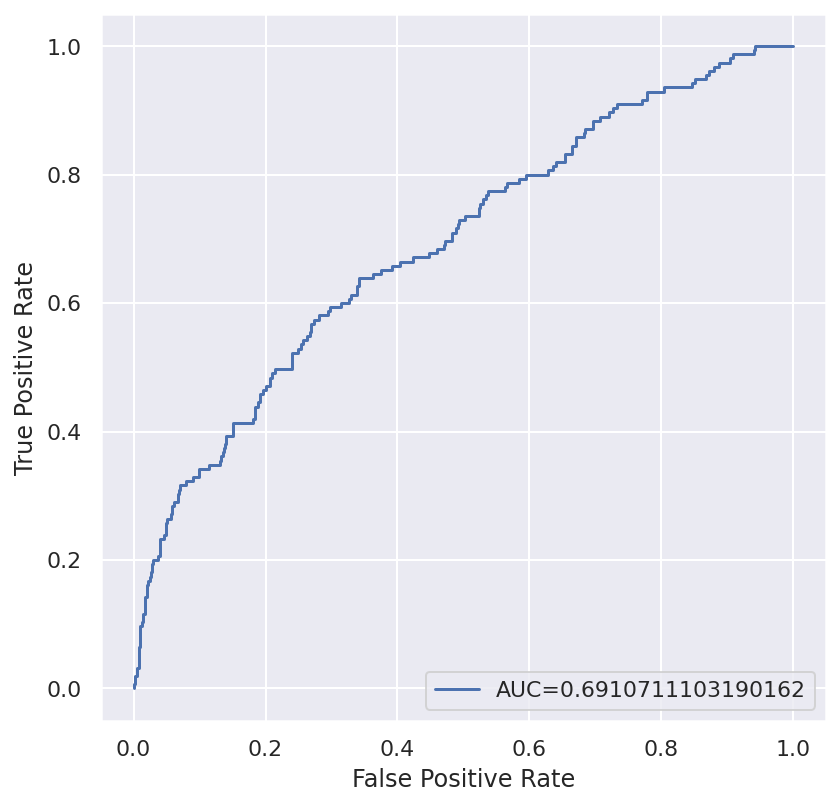

In [212]:
#ROC CURVE

from sklearn import metrics
import matplotlib.pyplot as plt
fpr, tpr, _ = metrics.roc_curve(y_test,  result.predict(X_test))
auc = metrics.roc_auc_score(y_test, result.predict(X_test))


plt.plot(fpr,tpr,label="AUC="+str(auc))
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend(loc=4)
plt.show()

# **5. Naive Bayes**

In [213]:
# For this part, we will eliminate highly correlated variables from the data

df_n = df.drop(['cigsPerDay', 'sysBP', 'sex'], axis = 1)

In [214]:
# Splitting the dataset into train and test

from sklearn.model_selection import train_test_split
X = df_n.iloc[:,:13]
y = df_n.iloc[:,13]

X_train, X_test, y_train, y_test = train_test_split(X, y,
                                   random_state=104, 
                                   test_size=0.25, 
                                   shuffle=True)

data_train = pd.concat([X_train, y_train], axis=1)
data_test = pd.concat([X_test,y_test], axis=1)

In [215]:
# Encoding the education variable and changing the data format for the categorical variables to be int64

data_train_nvb = data_train.copy()

data_train_nvb['education0'] = (data_train['education'] == 0).astype(int)
data_train_nvb['education1'] = (data_train['education'] == 1).astype(int)
data_train_nvb['education2'] = (data_train['education'] == 2).astype(int)
data_train_nvb['education3'] = (data_train['education'] == 3).astype(int)

X_train_nvb = data_train_nvb.copy()
X_train_nvb = X_train_nvb.drop(['education', 'TenYearCHD'], axis = 1)
X_train_nvb['BPMeds'] = X_train_nvb['BPMeds'].astype(np.int64)
X_train_nvb['currentSmoker'] = X_train_nvb['currentSmoker'].astype(np.int64)
X_train_nvb['prevalentStroke'] = X_train_nvb['prevalentStroke'].astype(np.int64)
X_train_nvb['prevalentHyp'] = X_train_nvb['prevalentHyp'].astype(np.int64)
X_train_nvb['diabetes'] = X_train_nvb['diabetes'].astype(np.int64)
X_train_nvb['male'] = X_train_nvb['male'].astype(np.int64)

y_train_nvb = data_train.iloc[:,13].astype(np.int64)

data_test_nvb = data_test.copy()

data_test_nvb['education0'] = (data_test['education'] == 0).astype(int)
data_test_nvb['education1'] = (data_test['education'] == 1).astype(int)
data_test_nvb['education2'] = (data_test['education'] == 2).astype(int)
data_test_nvb['education3'] = (data_test['education'] == 3).astype(int)

X_test_nvb = data_test_nvb.copy()
X_test_nvb = X_test_nvb.drop(['education', 'TenYearCHD'], axis = 1)
X_test_nvb['BPMeds'] = X_test_nvb['BPMeds'].astype(np.int64)
X_test_nvb['currentSmoker'] = X_test_nvb['currentSmoker'].astype(np.int64)
X_test_nvb['prevalentStroke'] = X_test_nvb['prevalentStroke'].astype(np.int64)
X_test_nvb['prevalentHyp'] = X_test_nvb['prevalentHyp'].astype(np.int64)
X_test_nvb['diabetes'] = X_test_nvb['diabetes'].astype(np.int64)
X_test_nvb['male'] = X_test_nvb['male'].astype(np.int64)

y_test_nvb = data_test.iloc[:,13].astype(np.int64)

In [216]:
pip install mixed-naive-bayes

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [217]:
# Mixed Naive Bayes (this algorythm has the argumet to include the indexes of the categorical variables)

from mixed_naive_bayes import MixedNB

clf = MixedNB(categorical_features=[0, 2, 3, 4, 5, 6, 12, 13, 14, 15])

clf.fit(X_train_nvb,y_train_nvb)

y_test_nvb_predicted = pd.DataFrame(clf.predict(X_test_nvb))

In [218]:
# Analyzing the results using a confusion matrix and classical classification metrics: accurary, precision, recall and F1 score

performance(y_test_nvb, y_test_nvb_predicted)

The confusion matrix is:
[[856  49]
 [120  35]] 

Accuracy: 0.84
Precision: 0.42
Recall: 0.23
F1: 0.29


## **5.1 Naive Bayes with oversampling** 



In [219]:
# Naive Bayes algorithm with oversampling the train data

from imblearn.over_sampling import SMOTENC

smotenc = SMOTENC(random_state=42, categorical_features=[0, 2, 3, 4, 5, 6, 12, 13, 14, 15])
X_train_smotenc,y_train_smotenc = smotenc.fit_resample(X_train_nvb,y_train_nvb)

clf1 = MixedNB(categorical_features=[0, 2, 3, 4, 5, 6, 12, 13, 14, 15])
clf1.fit(X_train_smotenc, y_train_smotenc)
y_train_nvb_predicted_smotenc = pd.DataFrame(clf1.predict(X_train_smotenc))
y_test_nvb_predicted_smotenc = clf1.predict(X_test_nvb)

In [220]:
# Analyzing the results using a confusion matrix and classical classification metrics: accurary, precision, recall and F1 score


performance(y_test_nvb, y_test_nvb_predicted_smotenc )

The confusion matrix is:
[[685 220]
 [ 69  86]] 

Accuracy: 0.73
Precision: 0.28
Recall: 0.55
F1: 0.37


## **5.2 Naive Bayes with oversampling and k-flod validation**


In [221]:
# X = df_n.iloc[:,:13]
# y = df_n.iloc[:,13]

In [222]:
# from sklearn.model_selection import KFold
# from sklearn.naive_bayes import GaussianNB

# # Instantiating the K-Fold cross validation object with 5 folds
# k_folds = KFold(n_splits = 5, shuffle = True, random_state = 42)
# # Iterating through each of the folds in K-Fold
# for train_index, val_index in k_folds.split(X):
    
#     # Splitting the training set from the validation set for this specific fold
#     X_train, X_val = X.iloc[train_index, :], X.iloc[val_index, :]
#     y_train, y_val = y.iloc[train_index], y.iloc[val_index]
    
#     # oversampling the train data
#     smotenc = SMOTENC(random_state=42, categorical_features=[0, 2, 3, 4, 5, 6])
#     X_train,y_train = smotenc.fit_resample(X_train,y_train)


#     # Instantiating a RandomForestClassifier model
#     clf = GaussianNB()
#     # Fitting the X_train and y_train datasets to the RandomForestClassifier model
#     clf.fit(X_train,y_train)
    
#     # Getting inferential predictions for the validation dataset
#     y_test_nvb_predicted = clf.predict(X_val)
    
#     # Generating validation metrics by comparing the inferential predictions (val_preds) to the actuals (y_val)
#     performance(y_val, y_test_nvb_predicted)
    
   

# **6. Random Forest**

In [223]:
# Splitting the dataset into train and test

from sklearn.model_selection import train_test_split
X = df.iloc[:,:15]
y = df.iloc[:,15]

X_train, X_test, y_train, y_test = train_test_split(X, y,
                                   random_state=104, 
                                   test_size=0.25, 
                                   shuffle=True)

data_train = pd.concat([X_train, y_train], axis=1)
data_test = pd.concat([X_test,y_test], axis=1)

In [224]:
# Random forest algorythm

from sklearn.ensemble import RandomForestClassifier
clf = RandomForestClassifier(max_depth=None, n_estimators=200, random_state=0)

clf.fit(X_train, y_train)

y_pred = pd.DataFrame(clf.predict(X_test))

In [225]:
# Representation

estimator = clf.estimators_[0] #first tree of random forest

feature_names = ['male', 'age',	'education',	'currentSmoker',	'cigsPerDay',	
                 'BPMeds',	'prevalentStroke', 'prevalentHyp',	'diabetes',
                 'totChol',	'sysBP',	'diaBP',	'BMI',	'heartRate', 'glucose']

target_names = ['yes', 'no'] #for 1 and 0 in TenYearCHD

from sklearn.tree import export_graphviz
export_graphviz(estimator, out_file='heart_disease.dot', 
                feature_names=feature_names,
                class_names=target_names,
                filled=True)

from subprocess import call
call(['dot', '-Tpng', 'heart_disease.dot', '-o', 'heart_disease.png', '-Gdpi=600']) #convert

from IPython.display import Image
Image(filename = 'heart_disease.png') #display

In [226]:
# Analyzing the results using a confusion matrix and classical classification metrics: accurary, precision, recall and F1 score
 
performance(y_test, y_pred)

The confusion matrix is:
[[901   4]
 [147   8]] 

Accuracy: 0.86
Precision: 0.67
Recall: 0.05
F1: 0.10


## **6.1 Random Forest with Oversampling**

In [227]:
# Splitting the dataset into train and test

from sklearn.model_selection import train_test_split
X = df.iloc[:,:15]
y = df.iloc[:,15]

X_train, X_test, y_train, y_test = train_test_split(X, y,
                                   random_state=104, 
                                   test_size=0.25, 
                                   shuffle=True)

from imblearn.over_sampling import SMOTENC

smotenc = SMOTENC(random_state=42, categorical_features=[0, 2, 3, 4, 5, 6])
X_train,y_train = smotenc.fit_resample(X_train,y_train)


In [228]:
# Random forest algorythm

from sklearn.ensemble import RandomForestClassifier
clf = RandomForestClassifier(max_depth=None, n_estimators=200, random_state=0)

clf.fit(X_train, y_train)

y_pred = pd.DataFrame(clf.predict(X_test))

In [229]:
# Analyzing the results using a confusion matrix and classical classification metrics: accurary, precision, recall and F1 score
 
performance(y_test, y_pred)

The confusion matrix is:
[[784 121]
 [108  47]] 

Accuracy: 0.78
Precision: 0.28
Recall: 0.30
F1: 0.29


# **7. XGBOOST with othersampling**

In [230]:
# Splitting the dataset into train and test

from sklearn.model_selection import train_test_split
X = df_n.iloc[:,:13]
y = df_n.iloc[:,13]

X_train, X_test, y_train, y_test = train_test_split(X, y,
                                   random_state=104, 
                                   test_size=0.25, 
                                   shuffle=True)


In [231]:
# XGBoosting - with oversampling ADASYN

from imblearn.over_sampling import ADASYN
ada = ADASYN(random_state=42)

X_train_adasyn,y_train_adasyn = ada.fit_resample(X_train,y_train)

In [232]:
# XGBOOST classfier
from xgboost import XGBClassifier
model = XGBClassifier(objective ='reg:squarederror',
                         colsample_bytree=0.5,
                         eval_metric='rmse',
                         learning_rate=0.05,
                         max_depth=3,
                         subsample=0.5)
model.fit(X_train_adasyn, y_train_adasyn)
y_test_XGBC_predicted_adasyn = model.predict(X_test)

In [233]:
# Analyzing the results using a confusion matrix and classical classification metrics: accurary, precision, recall and F1 score
 
performance(y_test, y_test_XGBC_predicted_adasyn)

The confusion matrix is:
[[619 286]
 [ 70  85]] 

Accuracy: 0.66
Precision: 0.23
Recall: 0.55
F1: 0.32
